In [1]:
from skmap.io import RasterData
from skmap.io import process
from pathlib import Path
from minio import Minio
from eumap.misc import find_files, nan_percentile, ttprint
from eumap.raster import read_rasters, save_rasters

tile = '005W_37N'
# raster_files = {'bsi': f'/mnt/inca/tillage_index/bsi/bsi_{tile}_'+'{dt}.tif'}

# http://192.168.1.30:8333/tmp-eumap-ai4sh/017E_52N/skmap_ndvi.peaks_m_20000101_20001231.tif
# raster_files = {'ndti': f'/mnt/inca/tillage_index/visual_check_tmp/{tile}/skmap_ndvi_20020501_20020630.tif'}
# ndvi = RasterData(raster_files, verbose=True) \
# .timespan(f'2020001', f'2022354', date_step=16, date_unit='days', date_format='%Y%j', date_style='start_date', ignore_29feb=True) \
# .read(n_jobs=4)

# files = [prefix_local+f'/gapfilled/{tile}/landsat_gapfilled_{band}_{tile}_{year}{dt}.tif' for dt in doy]
#         files = [Path(i) for i in files]
#         data,_ = read_rasters(raster_files=files, n_jobs = 30, verbose=True)
#         all_data.append(data)

files = find_files(f'/mnt/inca/tillage_index/visual_check_tmp/{tile}','skmap_ndvi_*.tif')

/mnt/inca/tillage_index/crop-bare-index/src/scikit-map/skmap/misc.py:27: UserWarning: ERROR: cannot import name '_centered' from 'scipy.signal.signaltools' (/home/opengeohub/.local/lib/python3.8/site-packages/scipy/signal/signaltools.py)

Encountered because skmap.io has additional dependencies, please try:

	pip install skmap[full]

  warnings.warn(


In [29]:
from matplotlib import cm
cmap = cm.RdYlGn
cmap = cmap.reversed()

bsi.animate(cmap=cmap, cbar_title='Bare Soil Index', img_title_text='date', vminmax=(-4000,4000),to_gif = '/mnt/primus/xuemeng_tmp_harbour/bare-soil/bsi_2020.gif')


In [24]:
raster_files = {'bsi': f'/mnt/inca/tillage_index/bsf/bsf_{tile}_'+'{dt}.tif'}

bsf = RasterData(raster_files, verbose=True) \
.timespan(f'2000', f'2021', date_step=1, date_unit='years', date_format='%Y', date_style='start_date', ignore_29feb=True) \
.read(n_jobs=4)

[11:54:51] RasterData with 22 rasters (band: 1) and 1 group(s)
[11:54:51] Reading 22 raster file(s) using 4 workers
[11:55:07] Read array shape: (4004, 4004, 22)


In [30]:
bsf.animate(cmap=cmap, cbar_title='Bare Soil Fraction', img_title_text='date', vminmax=(0,100), to_gif = '/mnt/primus/xuemeng_tmp_harbour/bare-soil/bsf_2000_2020.gif')


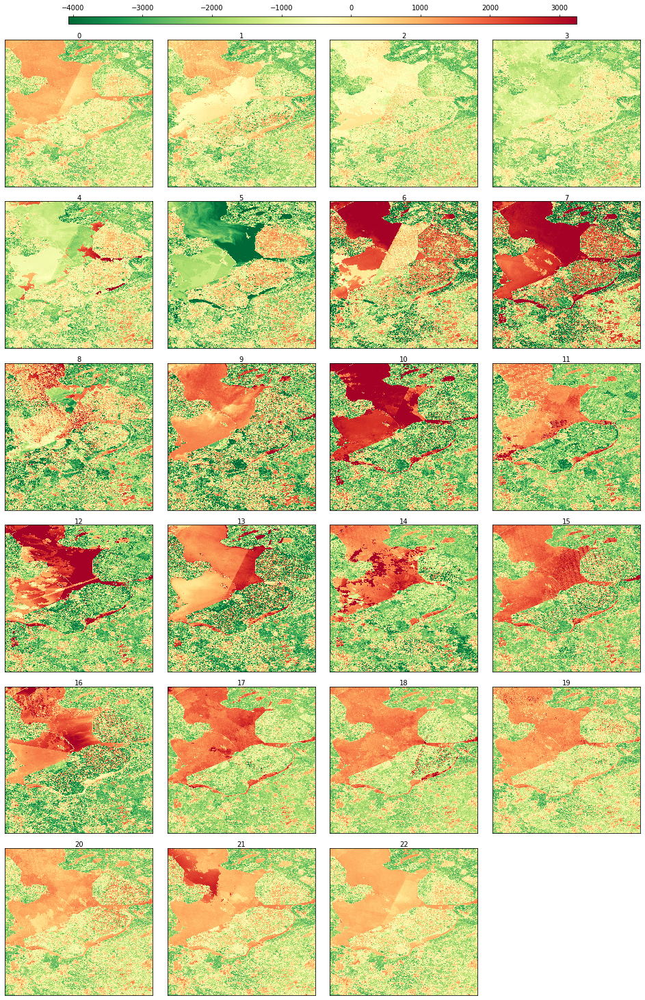

In [21]:
bsi.plot(cmap = cmap)